## 1. Set up Environment

In [1]:
# updated....!

# Install necessary libraries
!pip install kaggle
!pip install transformers
!pip install datasets
!pip install torch torchvision
!pip install pillow
!pip install evaluate
!pip install accelerate -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.8/162.8 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 6.1 MB/s eta 0:00:00
  Created wheel for kaggle: filename=kaggle-1.6.14-py3-none-any.whl size=105119 sha256=443d44f167c3e408873ab50a723ae38835367277e3d9d4bc4d9e784c1e2aa76f
  Stored in directory: /home/vladplyusnin/.cache/pip/wheels/d7/54/06/8a8f40cb39536605feb9acaacd0237a95eba39e5065e6392f4
Successfully built kaggle
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 5.0 MB/s eta 0:00:00


In [38]:
# Import dependencies
import os
import zipfile
from PIL import Image
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import ViTForImageClassification, ViTFeatureExtractor, Trainer, TrainingArguments
import evaluate
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pprint
import matplotlib.pyplot as plt
from tqdm import tqdm
import csv
from torchvision.transforms import functional as F
from PIL import ImageEnhance
import cv2

## 2. Authenticate and Download Kaggle Dataset

In [6]:
# Unzip the dataset
with zipfile.ZipFile('plant-pathology-2020-fgvc7.zip', 'r') as zip_ref:
    zip_ref.extractall('plant-pathology-2020-fgvc7p')
with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
    zip_ref.extractall('archive')


In [29]:
# Define custom dataset class
class PlantPathologyDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.dataframe = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.dataframe.iloc[idx, 0])
        image = Image.open(img_name + '.jpg').convert("RGB")
        label = self.dataframe.iloc[idx, 1:].values.astype('float32')
        if self.transform:
            image = self.transform(image)
        # Convert PIL Image to PyTorch tensor
        image = transforms.ToTensor()(image)
        return { 'pixel_values': image, 'label': label }
    
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.ToPILImage()
])

# Load CSV file
df_original = pd.read_csv(r'plant-pathology-2020-fgvc7p/train.csv')
df_combined = pd.read_csv(r'archive/train.csv')

# Split data into training and validation sets
train_df_original, val_df_original = train_test_split(df_original, test_size=0.2, random_state=42)
train_df_combined, val_df_combined = train_test_split(df_combined, test_size=0.2, random_state=42)



# Create datasets
#original
dataset_no_transform_original_train = PlantPathologyDataset(train_df_original, r'plant-pathology-2020-fgvc7p/images')
dataset_no_transform_original_val = PlantPathologyDataset(val_df_original, r'plant-pathology-2020-fgvc7p/images', transform=transform)

#combined
dataset_no_transform_combined_train = PlantPathologyDataset(train_df_combined, r'archive/images')
dataset_no_transform_combined_val = PlantPathologyDataset(val_df_combined, r'archive/images', transform=transform)

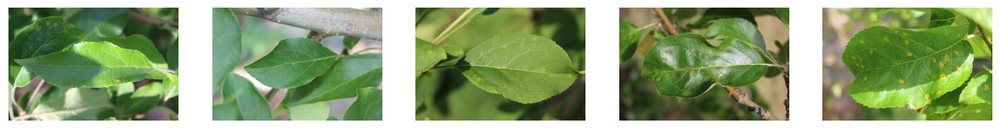

In [10]:
import numpy as np

# Function to show images without transformations
def show_images(dataset, num_images=5):
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        sample = dataset[i]
        image = sample['pixel_values'].numpy().transpose((1, 2, 0))
        image = image.clip(0, 1)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()

show_images(dataset_no_transform_original_train)

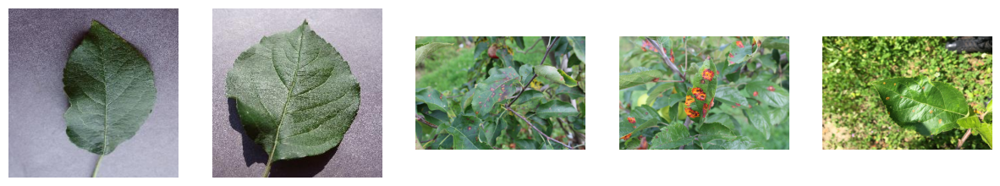

In [11]:
# Function to show images without transformations
def show_images(dataset, num_images=5):
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        sample = dataset[i+4000]
        image = sample['pixel_values'].numpy().transpose((1, 2, 0))
        image = image.clip(0, 1)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()

show_images(dataset_no_transform_combined_train)

## Resizing

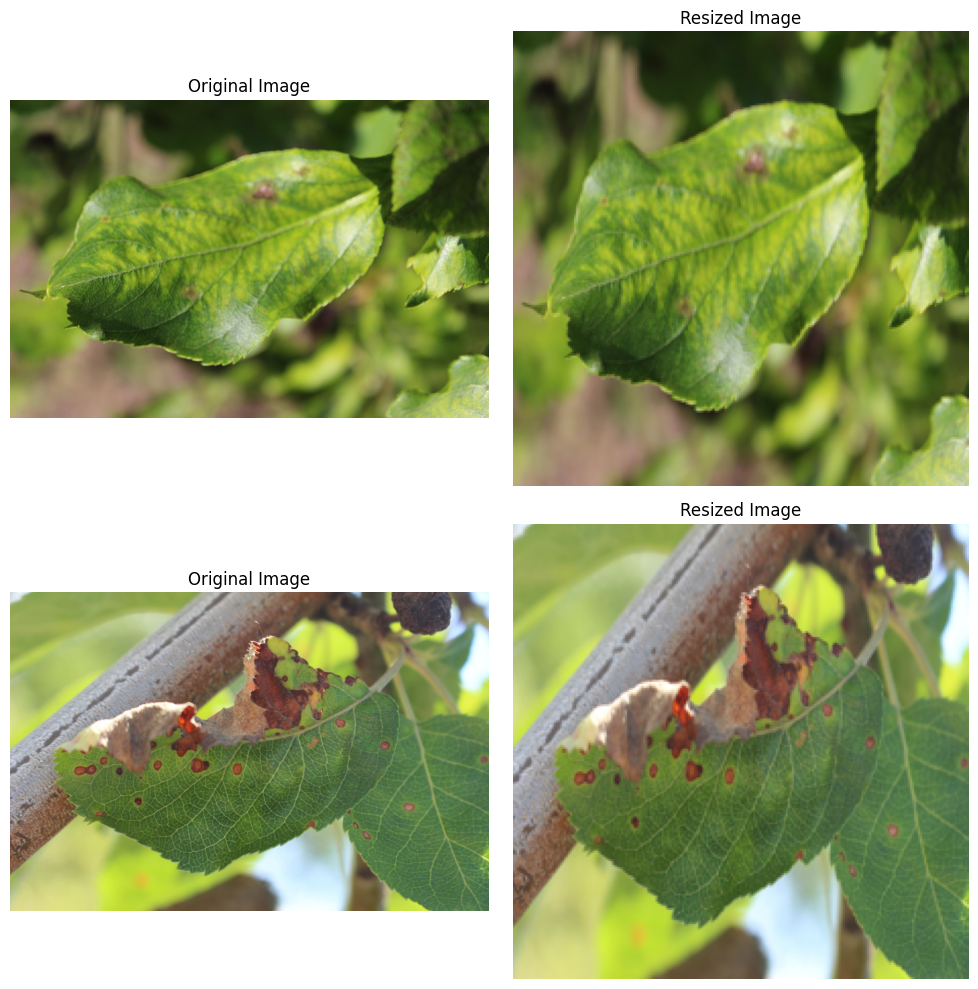

Average height: 1365
Average width: 2047


In [12]:
# Define the image directory and file paths based on the given data
img_dir = r'plant-pathology-2020-fgvc7p/images'  # Assuming images are in this directory
img_files = [os.path.join(img_dir, fname) + '.jpg' for fname in df_original['image_id']]

# Function to get image size
def get_image_size(img_path):
    with Image.open(img_path) as img:
        return img.size

# Calculate sizes of all images
img_sizes = [get_image_size(img_file) for img_file in img_files]

# Calculate average width and height
avg_width = int(sum(size[0] for size in img_sizes) / len(img_sizes))
avg_height = int(sum(size[1] for size in img_sizes) / len(img_sizes))

# Display original and resized images
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Load and display two original images
for i in range(2):
    img = Image.open(img_files[i])
    axes[i, 0].imshow(img)
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    # Resize and display the images
    img_resized = img.resize((224, 224))
    axes[i, 1].imshow(img_resized)
    axes[i, 1].set_title('Resized Image')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()
print(f'Average height: {avg_height}')
print(f'Average width: {avg_width}')

Resizing images to 224x224 to make equal size or all pictures . This standardization ensures uniformity across the dataset. Additionally, resizing introduces a slight blur to the images, which could potentially enhance model learning by smoothing out noise and emphasizing prominent features.

## Normalisation

100%|██████████| 1821/1821 [02:34<00:00, 11.82it/s]


Mean: [0.40419293 0.51288359 0.31361256]
Std: [0.20517409 0.19053545 0.18819576]


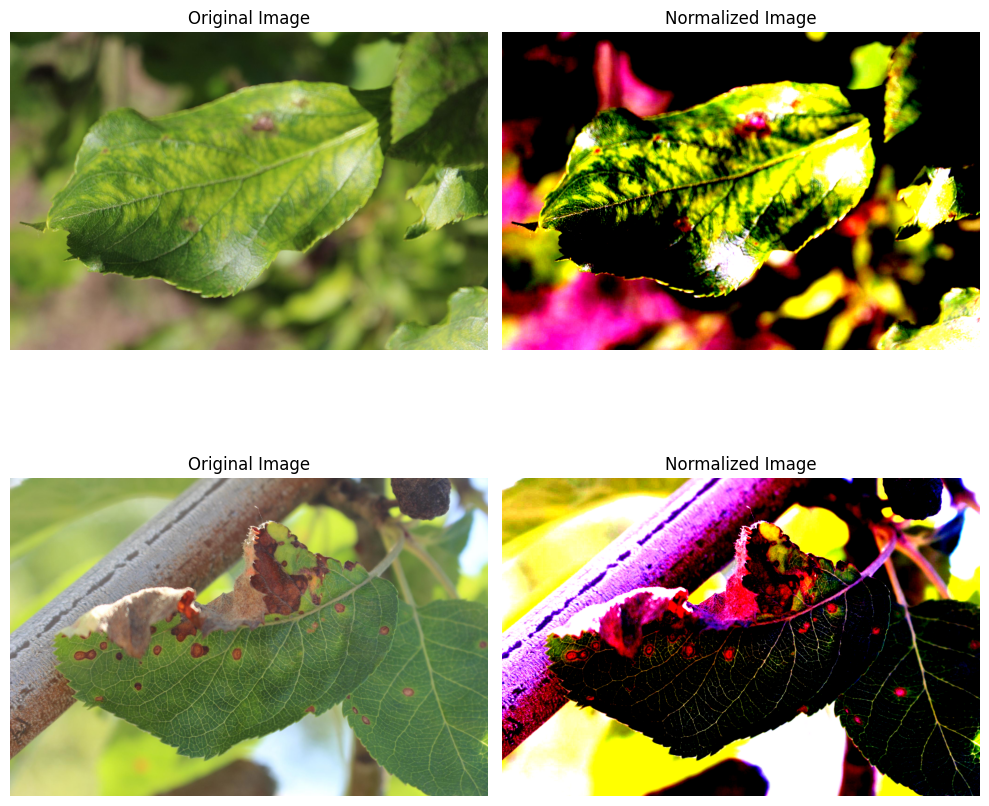

In [13]:
# Function to get image pixel values
def get_image_pixels(img_path):
    with Image.open(img_path) as img:
        return np.array(img).astype(np.float32) / 255.0

# Calculate sum and sum of squares for each image
sum_pixels = np.zeros(3)
sum_squared_pixels = np.zeros(3)
num_pixels = 0

for img_file in tqdm(img_files):
    pixels = get_image_pixels(img_file)
    sum_pixels += np.sum(pixels, axis=(0, 1))
    sum_squared_pixels += np.sum(pixels ** 2, axis=(0, 1))
    num_pixels += pixels.shape[0] * pixels.shape[1]

# Calculate mean
mean = sum_pixels / num_pixels

# Calculate std
std = np.sqrt(sum_squared_pixels / num_pixels - mean ** 2)

print(f'Mean: {mean}')
print(f'Std: {std}')

# Normalize function
def normalize_image(img, mean, std):
    img = (img - mean) / std
    img = np.clip(img, 0, 1)  # Clip values to be between 0 and 1
    return img

# Display original and normalized images
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Load and display two original images
for i in range(2):
    img = get_image_pixels(img_files[i])
    axes[i, 0].imshow(img)
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    # Normalize and display the images
    img_normalized = normalize_image(img, mean, std)
    axes[i, 1].imshow(img_normalized)
    axes[i, 1].set_title('Normalized Image')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

The normalization significantly alters the appearance of the leaves, potentially highlighting features like color variations and scab presence more distinctly.

## Flipping

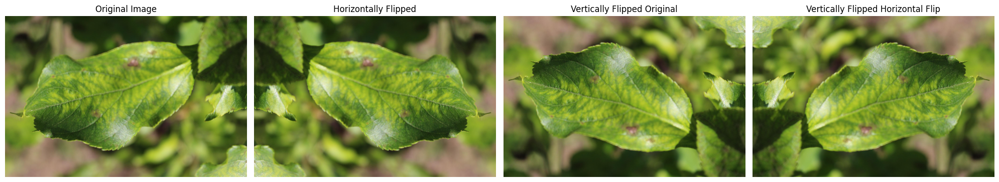

In [14]:
img_path = img_files[0]
image = Image.open(img_path)

# Perform the flips
h_flip = image.transpose(Image.FLIP_LEFT_RIGHT)
v_flip_original = image.transpose(Image.FLIP_TOP_BOTTOM)
v_flip_hflip = h_flip.transpose(Image.FLIP_TOP_BOTTOM)

# Display original and flipped images
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Display the images
axes[0].imshow(image)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(h_flip)
axes[1].set_title('Horizontally Flipped')
axes[1].axis('off')

axes[2].imshow(v_flip_original)
axes[2].set_title('Vertically Flipped Original')
axes[2].axis('off')

axes[3].imshow(v_flip_hflip)
axes[3].set_title('Vertically Flipped Horizontal Flip')
axes[3].axis('off')

plt.tight_layout()
plt.show()

## Brightness adjustment

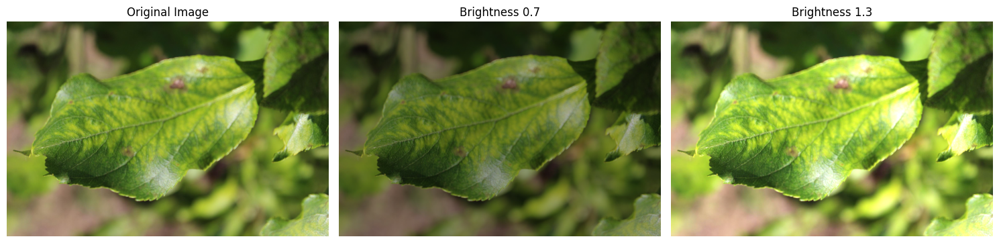

In [15]:
img_path = img_files[0]
image = Image.open(img_path)
# Adjust brightness
brightness_09 = ImageEnhance.Brightness(image).enhance(0.7)
brightness_11 = ImageEnhance.Brightness(image).enhance(1.3)

# Display original and brightness adjusted images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Display the images
axes[0].imshow(image)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(brightness_09)
axes[1].set_title('Brightness 0.7')
axes[1].axis('off')

axes[2].imshow(brightness_11)
axes[2].set_title('Brightness 1.3')
axes[2].axis('off')

plt.tight_layout()
plt.show()

## Rotation

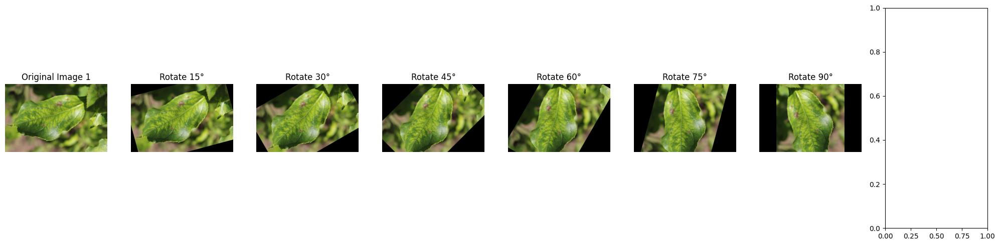

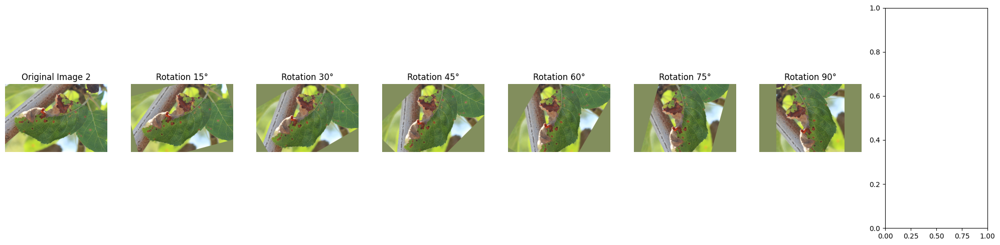

In [16]:
image1 = Image.open(img_files[0])
image2 = Image.open(img_files[1])
# Define rotation angles
rotation_angles = [15, 30, 45, 60, 75, 90]

# Calculate the average color for fill color
avg_color1 = tuple(np.array(image1).mean(axis=(0, 1)).astype(int))
avg_color2 = tuple(np.array(image2).mean(axis=(0, 1)).astype(int))

# Create the figure and axes for the first example
fig1, axes1 = plt.subplots(1, 8, figsize=(20, 5))  # 1 original + 6 rotated images
axes1 = axes1.flatten()

# Display original and rotated images for the first example
axes1[0].imshow(image1)
axes1[0].set_title('Original Image 1')
axes1[0].axis('off')

for i, angle in enumerate(rotation_angles):
    rotated_image = image1.rotate(angle)
    axes1[i + 1].imshow(rotated_image)
    axes1[i + 1].set_title(f'Rotate {angle}°')
    axes1[i + 1].axis('off')

plt.tight_layout()
plt.show()

# Create the figure and axes for the second example
fig2, axes2 = plt.subplots(1, 8, figsize=(20, 5))  # 1 original + 6 rotated images
axes2 = axes2.flatten()

# Display original and rotated images with fill color for the second example
axes2[0].imshow(image2)
axes2[0].set_title('Original Image 2')
axes2[0].axis('off')

for i, angle in enumerate(rotation_angles):
    rotated_image = image2.rotate(angle, fillcolor=avg_color2)
    axes2[i + 1].imshow(rotated_image)
    axes2[i + 1].set_title(f'Rotation {angle}°')
    axes2[i + 1].axis('off')

plt.tight_layout()
plt.show()

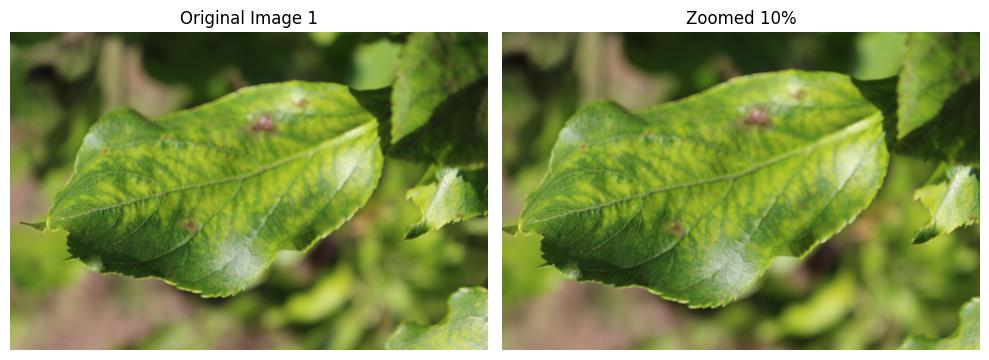

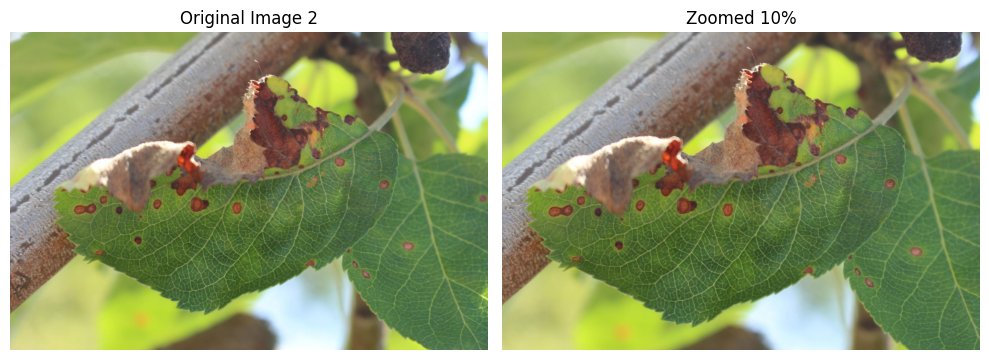

In [17]:
# Assuming img_files is a list containing the file paths of the images
image1 = Image.open(img_files[0])
image2 = Image.open(img_files[1])

# Define the zoom factor
zoom_factor = 1.1

# Calculate the average color for fill color
avg_color1 = tuple(np.array(image1).mean(axis=(0, 1)).astype(int))
avg_color2 = tuple(np.array(image2).mean(axis=(0, 1)).astype(int))

# Function to zoom an image by a given factor
def zoom_image(image, zoom_factor):
    width, height = image.size
    new_width, new_height = int(width * zoom_factor), int(height * zoom_factor)
    image = image.resize((new_width, new_height), Image.LANCZOS)
    left = (new_width - width) // 2
    top = (new_height - height) // 2
    right = (new_width + width) // 2
    bottom = (new_height + height) // 2
    return image.crop((left, top, right, bottom))

# Create the figure and axes for the first example
fig1, axes1 = plt.subplots(1, 2, figsize=(10, 5))  # 1 original + 1 zoomed image
axes1 = axes1.flatten()

# Display original and zoomed images for the first example
axes1[0].imshow(image1)
axes1[0].set_title('Original Image 1')
axes1[0].axis('off')

zoomed_image1 = zoom_image(image1, zoom_factor)
axes1[1].imshow(zoomed_image1)
axes1[1].set_title('Zoomed 10%')
axes1[1].axis('off')

plt.tight_layout()
plt.show()

# Create the figure and axes for the second example
fig2, axes2 = plt.subplots(1, 2, figsize=(10, 5))  # 1 original + 1 zoomed image
axes2 = axes2.flatten()

# Display original and zoomed images with fill color for the second example
axes2[0].imshow(image2)
axes2[0].set_title('Original Image 2')
axes2[0].axis('off')

zoomed_image2 = zoom_image(image2, zoom_factor)
axes2[1].imshow(zoomed_image2)
axes2[1].set_title('Zoomed 10%')
axes2[1].axis('off')

plt.tight_layout()
plt.show()

The second variant of rotation with average color of the picture will be used.

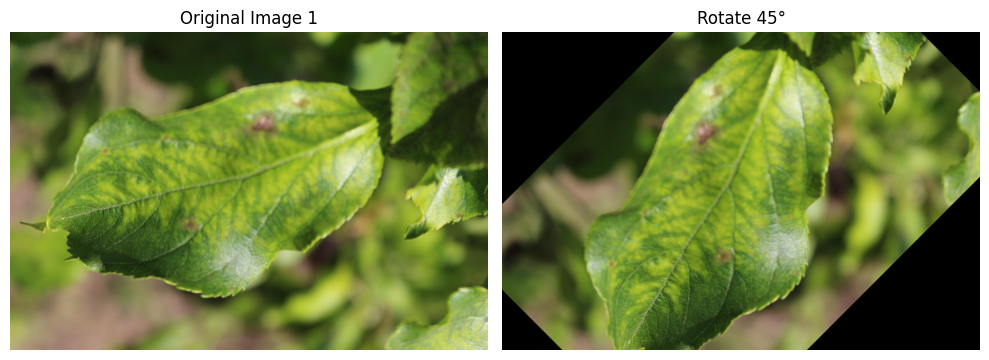

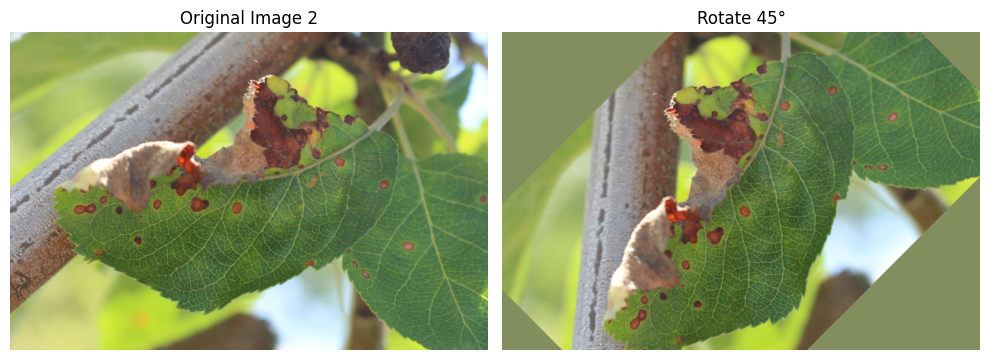

In [18]:
image1 = Image.open(img_files[0])
image2 = Image.open(img_files[1])

# Define the rotation angle for 45 degrees
rotation_angle = 45

# Calculate the average color for fill color
avg_color1 = tuple(np.array(image1).mean(axis=(0, 1)).astype(int))
avg_color2 = tuple(np.array(image2).mean(axis=(0, 1)).astype(int))

# Create the figure and axes for the first example
fig1, axes1 = plt.subplots(1, 2, figsize=(10, 5))  # 1 original + 1 rotated image
axes1 = axes1.flatten()

# Display original and 45-degree rotated images for the first example
axes1[0].imshow(image1)
axes1[0].set_title('Original Image 1')
axes1[0].axis('off')

rotated_image1 = image1.rotate(rotation_angle)
axes1[1].imshow(rotated_image1)
axes1[1].set_title(f'Rotate {rotation_angle}°')
axes1[1].axis('off')

plt.tight_layout()
plt.show()

# Create the figure and axes for the second example
fig2, axes2 = plt.subplots(1, 2, figsize=(10, 5))  # 1 original + 1 rotated image
axes2 = axes2.flatten()

# Display original and 45-degree rotated images with fill color for the second example
axes2[0].imshow(image2)
axes2[0].set_title('Original Image 2')
axes2[0].axis('off')

rotated_image2 = image2.rotate(rotation_angle, fillcolor=avg_color2)
axes2[1].imshow(rotated_image2)
axes2[1].set_title(f'Rotate {rotation_angle}°')
axes2[1].axis('off')

plt.tight_layout()
plt.show()

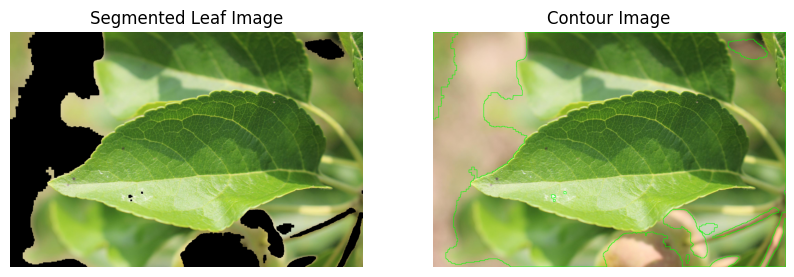

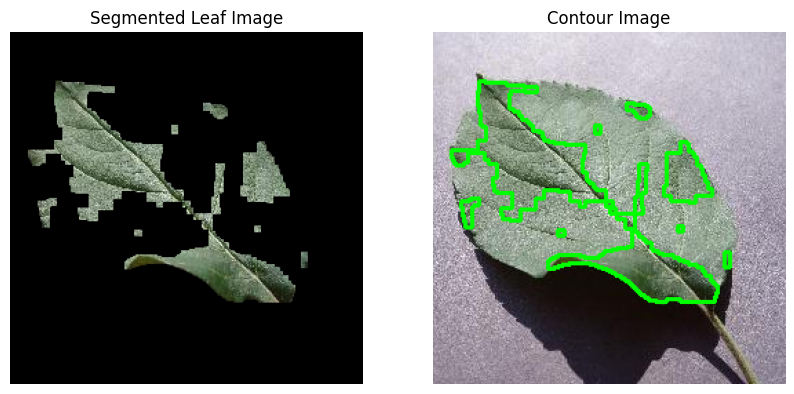

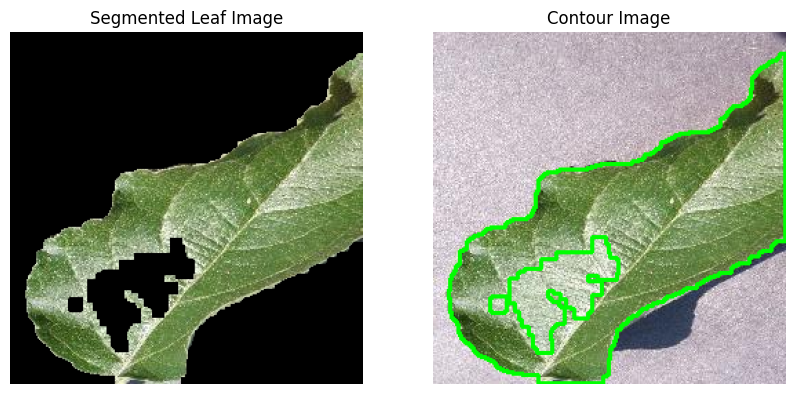

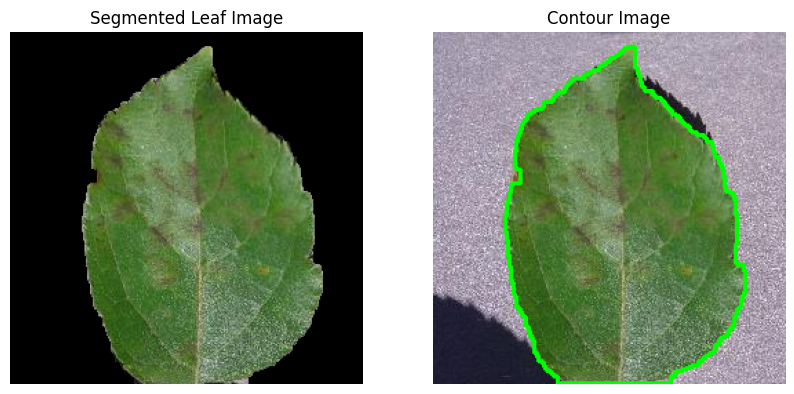

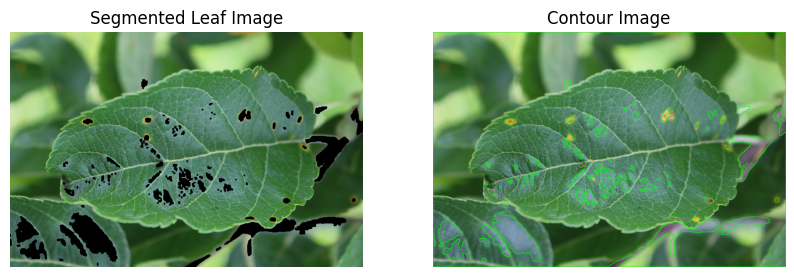

In [20]:
def segment_leaf(image_path, output_directory):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to the HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the range for the green color in HSV
    lower_green = np.array([25, 40, 40])  # Adjusted lower bound
    upper_green = np.array([85, 255, 255])  # Adjusted upper bound

    # Create a mask for the green color
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Apply morphological operations to clean up the mask
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    # Additional processing: Dilate and erode to enhance leaf segmentation
    mask = cv2.dilate(mask, kernel, iterations=2)
    mask = cv2.erode(mask, kernel, iterations=2)

    # Bitwise-and the mask with the original image to segment the leaf
    segmented_image = cv2.bitwise_and(image, image, mask=mask)

    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours
    contour_image = image.copy()
    cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

    # Get the file name from the image path
    file_name = os.path.basename(image_path)

    # Create the output path
    output_path = os.path.join(output_directory, file_name)

    # Save the segmented image
    cv2.imwrite(output_path, segmented_image)

    return segmented_image, contour_image

def process_images_in_directory(input_directory, output_directory, display_limit=5):
    # Ensure the output directory exists
    os.makedirs(output_directory, exist_ok=True)

    # List all image files in the directory
    image_files = [f for f in os.listdir(input_directory) if os.path.isfile(os.path.join(input_directory, f))]

    # Process only the first `display_limit` images
    for i, image_file in enumerate(image_files):
        if i >= display_limit:
            break
        image_path = os.path.join(input_directory, image_file)
        segmented_image, contour_image = segment_leaf(image_path, output_directory)

        # Display the original and segmented images
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
        axs[0].set_title('Segmented Leaf Image')
        axs[0].axis('off')
        axs[1].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
        axs[1].set_title('Contour Image')
        axs[1].axis('off')
        plt.show()

# Directory containing the input images
input_directory = r'archive/images'

# Directory to save the output images
output_directory = r'archive/ColorSegm'

# Process all images in the input directory and save them to the output directory
process_images_in_directory(input_directory, output_directory, display_limit=5)

In this dataset, it is quite challenging to segment leaves from the background using color separation techniques. As we can see, the segmentation works perfectly on images with a uniform background but struggles with pictures containing many leaves. The complexity of distinguishing individual leaves increases significantly in such scenarios due to the overlapping and similar colors of the leaves and the background foliage.

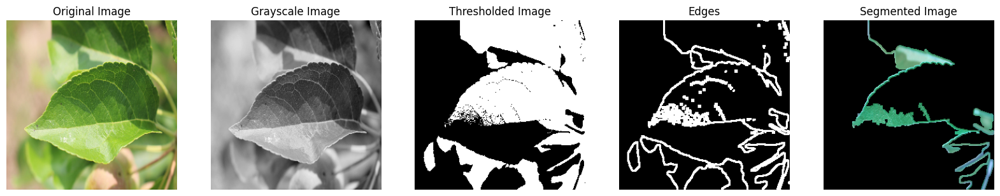

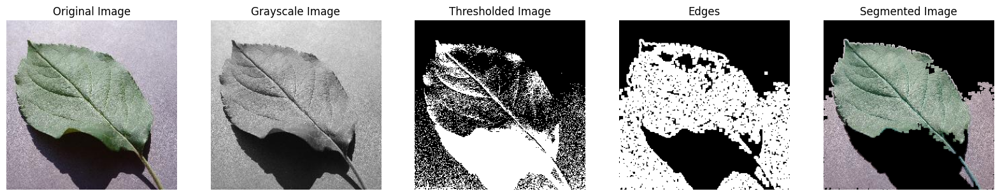

In [21]:
def segment_image(image_path, output_directory):
    # Load and preprocess the image
    sample_image = cv2.imread(image_path)
    img = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))

    # Convert to grayscale and apply thresholding
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, np.mean(gray), 255, cv2.THRESH_BINARY_INV)

    # Detect edges and dilate
    edges = cv2.dilate(cv2.Canny(thresh, 0, 255), None)

    # Find contours and create mask
    cnt = sorted(cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key=cv2.contourArea)[-1]
    mask = np.zeros((256, 256), np.uint8)
    masked = cv2.drawContours(mask, [cnt], -1, 255, -1)

    # Segment the regions
    dst = cv2.bitwise_and(img, img, mask=mask)
    segmented = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

    # Get the file name from the image path
    file_name = os.path.basename(image_path)

    # Create the output path
    output_path = os.path.join(output_directory, file_name)

    # Save the segmented image
    cv2.imwrite(output_path, segmented)

    # Display the results
    fig, axs = plt.subplots(1, 5, figsize=(20, 5))
    axs[0].imshow(img)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    axs[1].imshow(gray, cmap='gray')
    axs[1].set_title('Grayscale Image')
    axs[1].axis('off')

    axs[2].imshow(thresh, cmap='gray')
    axs[2].set_title('Thresholded Image')
    axs[2].axis('off')

    axs[3].imshow(edges, cmap='gray')
    axs[3].set_title('Edges')
    axs[3].axis('off')

    axs[4].imshow(segmented)
    axs[4].set_title('Segmented Image')
    axs[4].axis('off')

    plt.show()

# Directory containing the input images
input_directory = r'archive/images'

# Directory to save the output images
output_directory = r'archive/Segmentation'

# Ensure the input and output directories exist
os.makedirs(input_directory, exist_ok=True)
os.makedirs(output_directory, exist_ok=True)

# Process the first two images in the input directory
image_files = [f for f in os.listdir(input_directory) if os.path.isfile(os.path.join(input_directory, f))]
for i, image_file in enumerate(image_files[:2]):
    image_path = os.path.join(input_directory, image_file)
    segment_image(image_path, output_directory)

This series of images illustrates the difficulties encountered in segmenting leaves from a complex background using standard color separation techniques. The process includes converting to grayscale, applying thresholding, and detecting edges to achieve effective segmentation, which works well on uniform backgrounds but faces challenges with intricate, leaf-rich images.

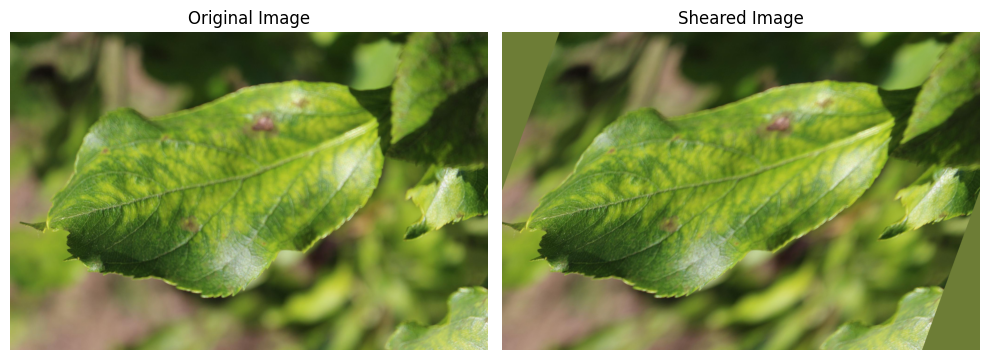

In [22]:
avg_color = tuple(np.array(image).mean(axis=(0, 1)).astype(int))

# Function to apply shear mapping
def shear_image(img, shear):
    return F.affine(img, angle=0, translate=(0, 0), scale=1, shear=shear, fill=avg_color)

# Load and display the first image
img_path = img_files[0]
image = Image.open(img_path)

# Apply shear mapping
shear = 20  # Shear factor for x direction
sheared_image = shear_image(image, shear)

# Display original and sheared images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the images
axes[0].imshow(image)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(sheared_image)
axes[1].set_title('Sheared Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()

This image has undergone a shearing transformation, which distorts the leaf along one axis.

## Augmented Data Set

## Combined data set

In [36]:
# Define the save_augmented_images function with resizing
def save_augmented_images(tensor_image, img_name, label, output_dir, label_file):
    resize_transform = transforms.Resize((224, 224))
    image = resize_transform(tensor_image)
    if img_name.startswith("train_add_"):
        inv_transform = transforms.Normalize(
            mean=[0.428, 0.458, 0.440],
            std= [0.194, 0.172, 0.216]
        )
        image = inv_transform(image)
    else:
        # Apply specific normalization
        inv_transform = transforms.Normalize(
            mean=[0.404, 0.512, 0.314],
            std=[0.205, 0.190, 0.188]
        )
        image = inv_transform(image)

    image = torch.clamp(image, 0, 1)
    image = transforms.ToPILImage()(image)

    # Calculate average color
    avg_color = tuple(np.array(image).mean(axis=(0, 1)).astype(int))

    # Function to save images and labels
    def save_image_and_label(img, img_name_suffix):
        img.save(os.path.join(output_dir, img_name_suffix + '.jpg'))
        with open(label_file, 'a', newline='') as file:
            writer = csv.writer(file)
            writer.writerow([img_name_suffix] + labels)

    # Original image
    save_image_and_label(image, img_name + '_original')

    # Brightness adjusted images
    brightness_07 = F.adjust_brightness(image, 0.7)
    save_image_and_label(brightness_07, img_name + '_brightness_07')

    brightness_12 = F.adjust_brightness(image, 1.2)
    save_image_and_label(brightness_12, img_name + '_brightness_12')

    # Apply 45 degree rotation and save
    rotated_image = image.rotate(45, fillcolor=avg_color)
    save_image_and_label(rotated_image, f'{img_name}_rotate_45')

    # Additional flipping and rotations for "multiple_diseases" class
    if labels[1] == 1:
        # 10% zoomed original image
        zoomed_image = F.affine(image, angle=0, translate=(0, 0), scale=1.1, shear=(0, 0), fill=avg_color)
        save_image_and_label(zoomed_image, f'{img_name}_zoom')

        # Shear Mapping
        sheared_image = F.affine(image, angle=0, translate=(0, 0), scale=1, shear=(45, 45), fill=avg_color)
        save_image_and_label(sheared_image, f'{img_name}_shear')

        sh_image = F.affine(image, angle=0, translate=(0, 0), scale=1, shear=(-45, -45), fill=avg_color)
        save_image_and_label(sh_image, f'{img_name}_sh')

        # Vertically flipped original image
        v_flip = image.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip, img_name + '_vflip')

        # Horizontally flipped image
        h_flip = image.transpose(Image.FLIP_LEFT_RIGHT)
        save_image_and_label(h_flip, img_name + '_hflip')

        # Horizontally flipped image
        zoom_h_flip = zoomed_image.transpose(Image.FLIP_LEFT_RIGHT)
        save_image_and_label(zoom_h_flip, img_name + '_hflip')

        # Vertically flipped original image
        zoom_v_flip = zoomed_image.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(zoom_v_flip, img_name + '_vflip')

        # Vertically flipped original image
        v_flip_sh_image = sh_image.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip_sh_image, img_name + '_vflip_sh_image')

        # Vertically flipped horizontally flipped image
        v_flip_hflip = h_flip.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip_hflip, img_name + '_vflip_hflip')

        # Horizontally flipped image
        h_flip_sh_image = sh_image.transpose(Image.FLIP_LEFT_RIGHT)
        save_image_and_label(h_flip_sh_image, img_name + '_hflip_sh_image')

        t_rotated_image = image.rotate(22.5, fillcolor=avg_color)
        save_image_and_label(t_rotated_image, f'{img_name}_rotate_22')

        s_rotated_image = image.rotate(77.5, fillcolor=avg_color)
        save_image_and_label(s_rotated_image, f'{img_name}_rotate_77')

        # Additional rotations
        rotation_angles = [22.5, 45, 77.5]
        for angle in rotation_angles:
          rotated_v_flip_hflip = v_flip_hflip.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_v_flip_hflip, f'{img_name}_vflip_hflip_rotate_{angle}')

          rotated_h_flip = h_flip.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_h_flip, f'{img_name}_hflip_rotate_{angle}')

          rotated_v_flip = v_flip.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_v_flip, f'{img_name}_vflip_rotate_{angle}')

          rotated_brightness_07 = brightness_07.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_brightness_07, f'{img_name}_brightness_07_rotate_{angle}')

          rotated_brightness_12 = brightness_12.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_brightness_12, f'{img_name}_brightness_12_rotate_{angle}')

          rotated_zoom_v_flip = zoom_v_flip.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_zoom_v_flip, f'{img_name}_zoom_vflip_rotate_{angle}')

          rotated_zoom_h_flip = zoom_h_flip.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_zoom_h_flip, f'{img_name}_zoom_hflip_rotate_{angle}')

          rotated_sh_image = sh_image.rotate(angle, fillcolor=avg_color)
          save_image_and_label(rotated_sh_image, f'{img_name}_sh_rotate_{angle}')

    if labels[2] == 1:
      t_rotated_image = image.rotate(22.5, fillcolor=avg_color)
      save_image_and_label(t_rotated_image, f'{img_name}_rotate_22')

      s_rotated_image = image.rotate(77.5, fillcolor=avg_color)
      save_image_and_label(s_rotated_image, f'{img_name}_rotate_77')

    if labels[3] == 1:
      t_rotated_image = image.rotate(22.5, fillcolor=avg_color)
      save_image_and_label(t_rotated_image, f'{img_name}_rotate_22')

      s_rotated_image = image.rotate(77.5, fillcolor=avg_color)
      save_image_and_label(s_rotated_image, f'{img_name}_rotate_77')
# Define directories and prepare the label file
img_dir = r'archive/images'
output_dir = r'archive/augmented_images4'
label_file = os.path.join(output_dir, 'augmented_labels.csv')

os.makedirs(output_dir, exist_ok=True)

# Initialize the label file
with open(label_file, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['image_id', 'healthy', 'multiple_diseases', 'rust', 'scab'])

for idx in tqdm(range(len(dataset_no_transform_combined_train))):
    sample = dataset_no_transform_combined_train[idx]
    image_tensor = sample['pixel_values']
    img_name = train_df_combined.iloc[idx, 0]
    labels = train_df_combined.iloc[idx, 1:].tolist()  # Assuming the label is in the second column
    save_augmented_images(image_tensor, img_name, labels, output_dir, label_file)

print("Image augmentation completed and saved to:", output_dir)

100%|██████████| 4953/4953 [01:42<00:00, 48.37it/s]

Image augmentation completed and saved to: archive/augmented_images4


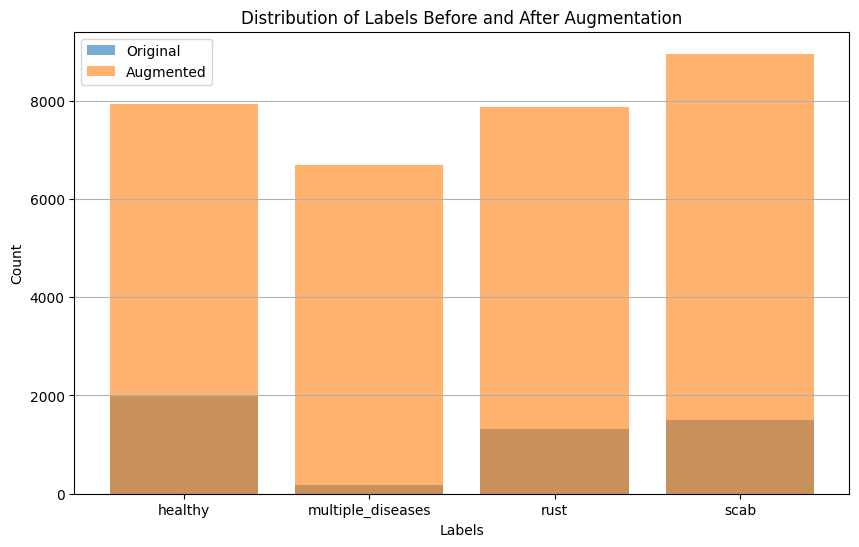

In [3]:
label_counts = train_df_combined[['healthy', 'multiple_diseases', 'rust', 'scab']].sum()
aug_train_df_combined = pd.read_csv(r'archive/augmented_images4/augmented_labels.csv')
new_label_counts = aug_train_df_combined[['healthy', 'multiple_diseases', 'rust', 'scab']].sum()
plt.figure(figsize=(10, 6))
plt.bar(label_counts.index, label_counts.values, alpha=0.6, label='Original')
plt.bar(new_label_counts.index, new_label_counts.values, alpha=0.6, label='Augmented')
plt.title('Distribution of Labels Before and After Augmentation')
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.legend()
plt.show()

# Original data set :

In [25]:
# Define the save_augmented_images function with resizing
def save_augmented_images(tensor_image, img_name, label, output_dir, label_file):
    resize_transform = transforms.Resize((224, 224))
    image = resize_transform(tensor_image)
    if img_name.startswith("train_add_"):
        inv_transform = transforms.Normalize(
            mean=[0.428, 0.458, 0.440],
            std= [0.194, 0.172, 0.216]
        )
        image = inv_transform(image)
    else:
        # Apply specific normalization
        inv_transform = transforms.Normalize(
            mean=[0.404, 0.512, 0.314],
            std=[0.205, 0.190, 0.188]
        )
        image = inv_transform(image)

    image = torch.clamp(image, 0, 1)
    image = transforms.ToPILImage()(image)

    # Calculate average color
    avg_color = tuple(np.array(image).mean(axis=(0, 1)).astype(int))

    # Function to save images and labels
    def save_image_and_label(img, img_name_suffix):
        img.save(os.path.join(output_dir, img_name_suffix + '.jpg'))
        with open(label_file, 'a', newline='') as file:
            writer = csv.writer(file)
            writer.writerow([img_name_suffix] + labels)

    # Original image
    save_image_and_label(image, img_name + '_original')

    # Vertically flipped original image
    v_flip = image.transpose(Image.FLIP_TOP_BOTTOM)
    save_image_and_label(v_flip, img_name + '_vflip')

    # Horizontally flipped image
    h_flip = image.transpose(Image.FLIP_LEFT_RIGHT)
    save_image_and_label(h_flip, img_name + '_hflip')

    # Shear Mapping
    sheared_image = F.affine(image, angle=0, translate=(0, 0), scale=1, shear=(20, 20), fill=avg_color)
    save_image_and_label(sheared_image, f'{img_name}_shear')

    # Brightness adjusted images
    brightness_07 = F.adjust_brightness(image, 0.7)
    save_image_and_label(brightness_07, img_name + '_brightness_07')

    brightness_12 = F.adjust_brightness(image, 1.2)
    save_image_and_label(brightness_12, img_name + '_brightness_12')

    # Apply 45 degree rotation and save
    rotated_image = image.rotate(45, fillcolor=avg_color)
    save_image_and_label(rotated_image, f'{img_name}_rotate_45')

    rotated_brightness_07 = brightness_07.rotate(45, fillcolor=avg_color)
    save_image_and_label(rotated_brightness_07, f'{img_name}_brightness_07_rotate_45')

    rotated_brightness_12 = brightness_12.rotate(45, fillcolor=avg_color)
    save_image_and_label(rotated_brightness_12, f'{img_name}_brightness_12_rotate_45')

    # Additional flipping and rotations for "multiple_diseases" class
    if labels[1] == 1:

        # 10% zoomed original image
        zoomed_image = F.affine(image, angle=0, translate=(0, 0), scale=1.1, shear=(0, 0), fill=avg_color)
        save_image_and_label(zoomed_image, f'{img_name}_zoom')

        # Horizontally flipped image
        zoom_h_flip = zoomed_image.transpose(Image.FLIP_LEFT_RIGHT)
        save_image_and_label(h_flip, img_name + '_hflip')

        # Vertically flipped original image
        zoom_v_flip = zoomed_image.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip, img_name + '_vflip')

        # Horizontally flipped image
        sh_h_flip = sheared_image.transpose(Image.FLIP_LEFT_RIGHT)
        save_image_and_label(h_flip, img_name + '_hflip')

        # Vertically flipped original image
        sh_v_flip = sheared_image.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip, img_name + '_vflip')

        # Vertically flipped horizontally flipped image
        v_flip_hflip = h_flip.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip_hflip, img_name + '_vflip_hflip')

        # Vertically flipped horizontally flipped image
        v_flip_hflip = sh_h_flip.transpose(Image.FLIP_TOP_BOTTOM)
        save_image_and_label(v_flip_hflip, img_name + '_vflip_hflip')

        # Additional rotations
        rotation_angles = [15, 30, 45, 60, 75]
        for angle in rotation_angles:
            rotated_v_flip_hflip = v_flip_hflip.rotate(angle, fillcolor=avg_color)
            save_image_and_label(rotated_v_flip_hflip, f'{img_name}_vflip_hflip_rotate_{angle}')

            rotated_image_angle = image.rotate(angle, fillcolor=avg_color)
            save_image_and_label(rotated_image_angle, f'{img_name}_rotate_{angle}')

            rotated_h_flip_angle = h_flip.rotate(angle, fillcolor=avg_color)
            save_image_and_label(rotated_h_flip_angle, f'{img_name}_hflip_rotate_{angle}')

            rotated_v_flip_angle = v_flip.rotate(angle, fillcolor=avg_color)
            save_image_and_label(rotated_v_flip_angle, f'{img_name}_vflip_rotate_{angle}')

            rotated_brightness_07_angle = brightness_07.rotate(angle, fillcolor=avg_color)
            save_image_and_label(rotated_brightness_07_angle, f'{img_name}_brightness_07_rotate_{angle}')

            rotated_brightness_12_angle = brightness_12.rotate(angle, fillcolor=avg_color)
            save_image_and_label(rotated_brightness_12_angle, f'{img_name}_brightness_12_rotate_{angle}')

# Define directories and prepare the label file
img_dir = r'plant-pathology-2020-fgvc7p/images'
output_dir = r'plant-pathology-2020-fgvc7p/augmented_images'
label_file = os.path.join(output_dir, 'augmented_labels.csv')

os.makedirs(output_dir, exist_ok=True)

# Initialize the label file
with open(label_file, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['image_id', 'healthy', 'multiple_diseases', 'rust', 'scab'])

for idx in tqdm(range(len(dataset_no_transform_original_train))):
    sample = dataset_no_transform_original_train[idx]
    image_tensor = sample['pixel_values']
    img_name = train_df_original.iloc[idx, 0]
    labels = train_df_original.iloc[idx, 1:].tolist()  # Assuming the label is in the second column
    save_augmented_images(image_tensor, img_name, labels, output_dir, label_file)

print("Image augmentation completed and saved to:", output_dir)


100%|██████████| 1456/1456 [00:47<00:00, 30.72it/s]

Image augmentation completed and saved to: plant-pathology-2020-fgvc7p/augmented_images


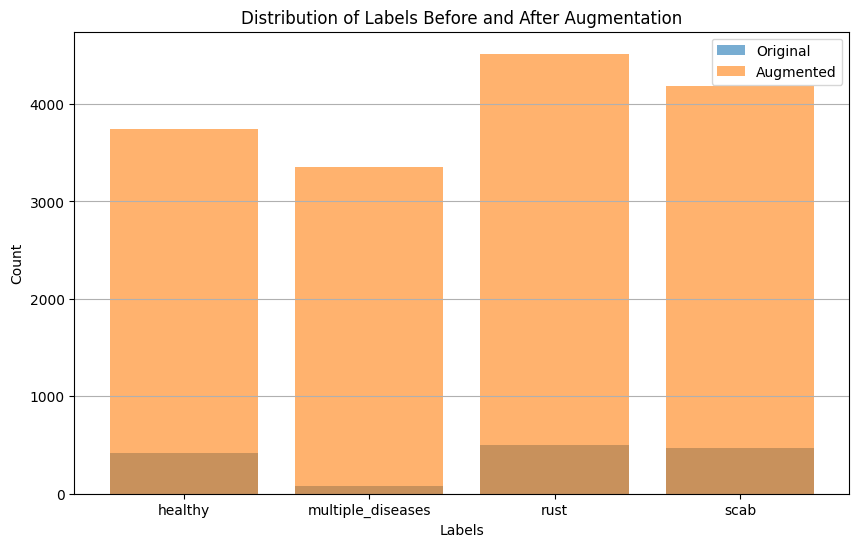

In [20]:
label_counts = train_df_original[['healthy', 'multiple_diseases', 'rust', 'scab']].sum()
aug_train_df_original = pd.read_csv(r'plant-pathology-2020-fgvc7p/augmented_images/augmented_labels.csv')
new_label_counts = aug_train_df_original[['healthy', 'multiple_diseases', 'rust', 'scab']].sum()
plt.figure(figsize=(10, 6))
plt.bar(label_counts.index, label_counts.values, alpha=0.6, label='Original')
plt.bar(new_label_counts.index, new_label_counts.values, alpha=0.6, label='Augmented')
plt.title('Distribution of Labels Before and After Augmentation')
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.legend()
plt.show()

In [30]:
aug_train_original_dataset = PlantPathologyDataset(aug_train_df_original, 'plant-pathology-2020-fgvc7p/augmented_images')

# Create dataloaders original
train_loader = DataLoader(aug_train_original_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(dataset_no_transform_original_val, batch_size=32)


In [5]:
aug_train_combined_dataset = PlantPathologyDataset(aug_train_df_combined, 'archive/augmented_images4')
# Create dataloaders combined
train_loader = DataLoader(aug_train_combined_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(dataset_no_transform_combined_val, batch_size=32)

## 4. Load Pre-trained Model and Tokenizer


In [36]:
# Load pre-trained model and feature extractor
model_name = "google/vit-base-patch16-224-in21k"
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name)
model = ViTForImageClassification.from_pretrained(model_name, num_labels=4)

# Adjust model to match the dataset labels
model.config.id2label = {0: 'healthy', 1: 'multiple_diseases', 2: 'rust', 3: 'scab'}
model.config.label2id = {'healthy': 0, 'multiple_diseases': 1, 'rust': 2, 'scab': 3}


/home/vladplyusnin/tftest/.venv/lib/python3.10/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## 5. Fine-tune the Model


In [39]:
metric = evaluate.load('accuracy')
metric_w = evaluate.combine(['precision','recall','f1'])

def compute_metrics(output):
    logits, labels = output
    predictions = np.argmax(logits, axis=1)
    references = np.argmax(labels, axis=1)
    return {
        **metric.compute(predictions=predictions, references=references),
        **metric_w.compute(predictions=predictions, references=references, average='weighted')
    }

# Define training arguments
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
)

# Define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=aug_train_original_dataset,
    eval_dataset=dataset_no_transform_original_val,
    compute_metrics=compute_metrics
)

# Train the model
trainer.train()



Step,Training Loss
10,0.699800
20,0.701000
30,0.687300
40,0.678600
50,0.661300
60,0.646100
70,0.625900
80,0.605200
90,0.589500
100,0.573800


TrainOutput(global_step=2964, training_loss=0.11365078804152295, metrics={'train_runtime': 929.2961, 'train_samples_per_second': 51.022, 'train_steps_per_second': 3.19, 'total_flos': 3.674348550442967e+18, 'train_loss': 0.11365078804152295, 'epoch': 3.0})

## 6. Evaluate the Model


{'test_accuracy': 0.4438356164383562,
 'test_f1': 0.3590567536046274,
 'test_loss': 0.8384745717048645,
 'test_precision': 0.4115975173634266,
 'test_recall': 0.4438356164383562,
 'test_runtime': 10.015,
 'test_samples_per_second': 36.445,
 'test_steps_per_second': 2.297}


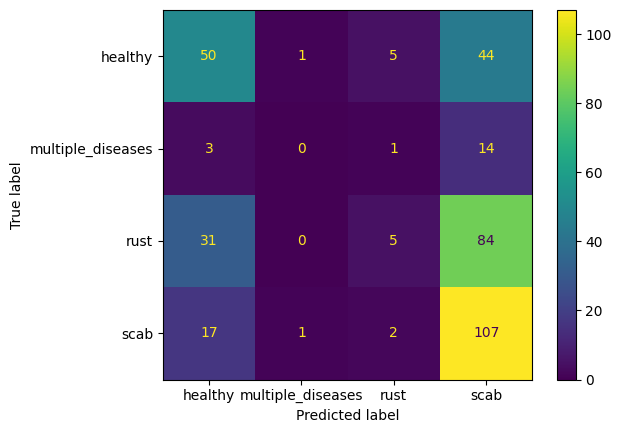

In [40]:
# Evaluate the model
trainer.evaluate()

def evaluate():
    logits, labels, metrics = trainer.predict(trainer.eval_dataset)
    predictions = np.argmax(logits, axis=1)
    references = np.argmax(labels, axis=1)
    pprint.pprint(metrics)
    ConfusionMatrixDisplay(confusion_matrix(references, predictions), display_labels=list(model.config.label2id.keys())).plot()

evaluate()

### The same steps for combined data set

In [7]:
# Load pre-trained model and feature extractor
model_name = "google/vit-base-patch16-224-in21k"
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name)
model = ViTForImageClassification.from_pretrained(model_name, num_labels=4)

# Adjust model to match the dataset labels
model.config.id2label = {0: 'healthy', 1: 'multiple_diseases', 2: 'rust', 3: 'scab'}
model.config.label2id = {'healthy': 0, 'multiple_diseases': 1, 'rust': 2, 'scab': 3}
def compute_metrics(output):
    logits, labels = output
    predictions = np.argmax(logits, axis=1)
    references = np.argmax(labels, axis=1)
    return {
        **metric.compute(predictions=predictions, references=references),
        **metric_w.compute(predictions=predictions, references=references, average='weighted')
    }

# Define training arguments
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
)

# Define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=aug_train_combined_dataset,
    eval_dataset=dataset_no_transform_combined_val,
    compute_metrics=compute_metrics
)

# Train the model
trainer.train()

def evaluate():
    logits, labels, metrics = trainer.predict(trainer.eval_dataset)
    predictions = np.argmax(logits, axis=1)
    references = np.argmax(labels, axis=1)
    pprint.pprint(metrics)
    ConfusionMatrixDisplay(confusion_matrix(references, predictions), display_labels=list(model.config.label2id.keys())).plot()

evaluate()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/home/vladplyusnin/tftest/.venv/lib/python3.10/site-packages/transformers/data/data_collator.py:141: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  batch["labels"] = torch.tensor([f["label"] for f in features], dtype=dtype)


Step,Training Loss
10,0.681600
20,0.681300
30,0.672300
40,0.666600
50,0.654800
60,0.641100
70,0.625600
80,0.607200
90,0.593300
100,0.574100


RuntimeError: stack expects each tensor to be equal size, but got [3, 1365, 2048] at entry 0 and [3, 256, 256] at entry 2